# Tutorial4: estimate 3D emission from EHT observations

---
This tutorial demonstrates the recovery of 3D emission from synthetic observations. Complex visibilities or closure phases are used to fit the parameters of a coordinate-based neural network (NeRF).

In [1]:
import bhnerf
import bhnerf.constants as consts
import numpy as np
import os
from datetime import datetime
from astropy import units
import ehtim as eh
from bhnerf.optimization import LogFn
from flax.training import checkpoints

import xarray as xr
import importlib
import matplotlib.pyplot as plt

# Runing on 2 GPUs
os.environ['CUDA_VISIBLE_DEVICES'] = '0,1'

/srv/tmp/kyle/miniconda3/envs/jax/lib/python3.9/site-packages/ehtim/__init__.py:56: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


Welcome to eht-imaging! v 1.2.4 



In [2]:
"""
Generate synthetic observations of a hot-spot
"""
fov_M = 16.0
spin = 0.2
inclination = np.deg2rad(60.0)      
nt = 64

array = 'ngEHT'             
flux_scale = 0.1                    # scale image-plane fluxes to `reasonable` values in Jy
tstart = 2.0 * units.hour           # observation start time
tstop = tstart + 40.0 * units.min   # observation stop time

# Compute geodesics (see Tutorial1)
geos = bhnerf.kgeo.image_plane_geos(
    spin, inclination, 
    num_alpha=64, num_beta=64, 
    alpha_range=[-fov_M/2, fov_M/2],
    beta_range=[-fov_M/2, fov_M/2]
)
Omega = np.sign(spin + np.finfo(float).eps) * np.sqrt(geos.M) / (geos.r**(3/2) + geos.spin * np.sqrt(geos.M))
t_injection = -float(geos.r_o)

# Generate hotspot measurements (see Tutorial2) 
emission_0 = flux_scale * bhnerf.emission.generate_hotspot_xr(
    resolution=(64, 64, 64), 
    rot_axis=[0.0, 0.0, 1.0], 
    rot_angle=0.0,
    orbit_radius=5.5,
    std=0.7,
    r_isco=bhnerf.constants.isco_pro(spin),
    fov=(fov_M, 'GM/c^2')
)
obs_params = {
    'mjd': 57851,                       # night of april 6-7, 2017
    'timetype': 'GMST',
    'nt': nt,                           # number of time samples 
    'tstart': tstart.to('hr').value,    # start of observations
    'tstop': tstop.to('hr').value,      # end of observation 
    'tint': 30.0,                       # integration time,
    'array': eh.array.load_txt('../eht_arrays/{}.txt'.format(array))
}
obs_empty = bhnerf.observation.empty_eht_obs(**obs_params)
fov_rad = (fov_M * consts.GM_c2(consts.sgra_mass) / consts.sgra_distance.to('m')) * units.rad
psize = fov_rad.value / geos.alpha.size 
obs_args = {'psize': psize, 'ra': obs_empty.ra, 'dec': obs_empty.dec, 'rf': obs_empty.rf, 'mjd': obs_empty.mjd}
t_frames = np.linspace(tstart, tstop, nt)
image_plane = bhnerf.emission.image_plane_dynamics(emission_0, geos, Omega, t_frames, t_injection)
movie = eh.movie.Movie(image_plane, times=t_frames.value, **obs_args)
obs = bhnerf.observation.observe_same(movie, obs_empty, ttype='direct', seed=None)

2025-08-05 10:53:57.696276: W external/xla/xla/service/gpu/nvptx_compiler.cc:765] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.9.86). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.
/srv/tmp/kyle/miniconda3/envs/jax/lib/python3.9/site-packages/xarray/core/computation.py:821: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


Producing clean visibilities from movie with direct FT . . . 
Applying Jones Matrices to data . . . 
Adding thermal noise to data . . . 
Applying a priori calibration with estimated Jones matrices . . . 


In [ ]:
"""
Optimize network parameters to recover the 3D emission (as a continuous function) from observations 
Note that logging is done using tensorboardX. To view the tensorboard (from the main directory):
    `tensorboard --logdir runs`
"""
batchsize = 6
z_width = 4                # maximum disk width [M]
rmax = fov_M / 2           # maximum recovery radius
rmin = float(geos.r.min()) # minimum recovery radius
hparams = {'num_iters': 5000, 'lr_init': 1e-4, 'lr_final': 1e-6}

# Logging 
current_time = datetime.now().strftime('%Y-%m-%d.%H:%M:%S')
runname = 'tutorial4/recovery.vis.{}'.format("2025-08-05.09:51:12")
writer = bhnerf.optimization.SummaryWriter(logdir='../runs/{}'.format(runname))
writer.add_images('emission/true', bhnerf.utils.intensity_to_nchw(emission_0), global_step=0)
log_fns = [
    LogFn(lambda opt: writer.add_scalar('log_loss/train', np.log10(np.mean(opt.loss)), global_step=opt.step)), 
    LogFn(lambda opt: writer.recovery_3d(fov_M, emission_true=emission_0)(opt), log_period=200)
]

# Observation parameters 
chisqdata = eh.imaging.imager_utils.chisqdata_vis
train_step = bhnerf.optimization.TrainStep.eht(t_frames, obs, movie.fovx(), movie.xdim, chisqdata)

# Optimization
predictor = bhnerf.network.NeRF_Predictor(rmax, rmin, rmax, z_width)
raytracing_args = bhnerf.network.raytracing_args(geos, Omega, t_injection, t_frames[0])
optimizer = bhnerf.optimization.Optimizer(hparams, predictor, raytracing_args, checkpoint_dir='../checkpoints/{}'.format(runname))
optimizer.run(batchsize, train_step, raytracing_args, log_fns=log_fns)

Splitting Observation File into 64 times


2025-08-05 09:51:16.307764: W external/xla/xla/service/gpu/nvptx_compiler.cc:765] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.9.86). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.
/srv/tmp/kyle/miniconda3/envs/jax/lib/python3.9/site-packages/xarray/core/computation.py:821: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


iteration:   0%|          | 0/5000 [00:00<?, ?it/s]

In [ ]:
"""OR reload a pretrained network"""
chisqdata = eh.imaging.imager_utils.chisqdata_vis

checkpoint_dir = '/srv/tmp/kyle/bhnerf/checkpoints/tutorial4/recovery.vis.2025-08-05.09:51:12/'
predictor = bhnerf.network.NeRF_Predictor.from_yml(checkpoint_dir)
state = checkpoints.restore_checkpoint(checkpoint_dir, None)

params = state['params']
raytracing_args = bhnerf.network.raytracing_args(geos, Omega, t_injection, t_frames[0])

/srv/tmp/kyle/miniconda3/envs/jax/lib/python3.9/site-packages/xarray/core/computation.py:821: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


In [70]:
"""
Visualize the recovered 3D emission
This visualization requires ipyvolume: https://ipyvolume.readthedocs.io/en/latest/
"""
emission_estimate = bhnerf.network.sample_3d_grid(predictor.apply, params, fov=fov_M)
bhnerf.visualization.ipyvolume_3d(emission_estimate, fov=fov_M, level=[0, 0.2, 0.7])

Container(children=[VBox(children=(HBox(children=(Label(value='levels:'), FloatSlider(value=0.0, max=1.0, step…

In [5]:
movie = True
from pathlib import Path

def load_predictor(checkpoint_dir, run_dir):
    """Return (apply_fn, params) for a NeRF_Predictor checkpoint."""
    predictor = bhnerf.network.NeRF_Predictor.from_yml(run_dir)
    params    = checkpoints.restore_checkpoint(checkpoint_dir, None)['params']
    return predictor.apply, params

def predict_movie(apply_fn, params, ray_args, t_frames, chunk=16):
    """
    Evaluate the network on *all* requested times without OOM’ing.
    Returns numpy array with shape (nt, S, y, x).
    """
    # unpack once for speed/readability
    coords, Omega = ray_args['coords'], ray_args['Omega']
    J,  g, dtau   = ray_args['J'],  ray_args['g'], ray_args['dtau']
    Sigma         = ray_args['Sigma']
    t_start_obs   = ray_args['t_start_obs']
    t_geos        = ray_args['t_geos']
    t_injection   = ray_args['t_injection']
    t_units       = t_start_obs.unit if isinstance(t_start_obs, units.Quantity) else None

    frames = []
    for k in range(0, len(t_frames), chunk):           # small batches
        t_batch = t_frames[k:k + chunk]
        batch   = bhnerf.network.image_plane_prediction(
            params, apply_fn, t_batch, coords, Omega, J, g, dtau, Sigma,
            t_start_obs, t_geos, t_injection, t_units
        )
        frames.append(np.asarray(batch))               # to host mem
    return np.concatenate(frames, axis=0)              # (nt,S,y,x)                 # shape (nt, nx, ny)

movies=[]
ROOT = Path('/srv/tmp/kyle/bhnerf/checkpoints/ensemble')
for seed_dir in sorted(ROOT.iterdir()):
    run_dirs = [d for d in seed_dir.iterdir() if d.is_dir()]
    if not run_dirs:
        raise ValueError(f'[skip] {seed_dir.name}: no run directory found')
    run_dir = max(run_dirs, key=lambda p: p.stat().st_mtime)   # newest run

    ckpts = list(run_dir.glob('checkpoint_*'))
    if not ckpts:
        raise ValueError(f'[skip] {run_dir}: no checkpoints')
    ckpt_dir = max(ckpts, key=lambda p: int(p.name.split('_')[-1]))

    apply_fn, params = load_predictor(ckpt_dir, run_dir)
    movie = predict_movie(apply_fn, params, raytracing_args, t_frames, chunk=4)
    movies.append(movie.astype(np.float32))

movies = np.stack(movies)

KeyboardInterrupt: 

In [ ]:
"""ignore everything below this, it lies in tutorial 6 and 7"""
from pathlib import Path
samples=[]
ROOT = Path('/srv/tmp/kyle/bhnerf/checkpoints/ensemble')
for seed_dir in sorted(ROOT.iterdir()):
    run_dirs = [d for d in seed_dir.iterdir() if d.is_dir()]
    if not run_dirs:
        raise ValueError(f'[skip] {seed_dir.name}: no run directory found')
    run_dir = max(run_dirs, key=lambda p: p.stat().st_mtime)   # newest run

    ckpts = list(run_dir.glob('checkpoint_*'))
    if not ckpts:
        raise ValueError(f'[skip] {run_dir}: no checkpoints')
    ckpt_dir = max(ckpts, key=lambda p: int(p.name.split('_')[-1]))

    predictor = bhnerf.network.NeRF_Predictor.from_yml(run_dir)
    state = checkpoints.restore_checkpoint(ckpt_dir, None)
    emission = bhnerf.network.sample_3d_grid(predictor.apply, state['params'], fov=fov_M)
    break
    samples.append(emission.astype(np.float32))

#samples = np.stack(samples)
#mean_vol = samples.mean(axis=0)
#std_vol = samples.std(axis=0)


In [72]:
import bhnerf.uncertainty as unc
importlib.reload(bhnerf.uncertainty)

k = 0 # the t_frame we want to compute uncertainty for
times, sigma, A = unc.build_A_per_frame(obs, t_frames, movie.fovx(), movie.xdim)
sigma= sigma[k]
A = A[k]

# ensure raytracing args have proper shapes for broadcasting in forward model
print()
print("full movie params----------")
for key in raytracing_args.keys():
    if key == "J":
        print("J:", {raytracing_args[key]})
    elif key == "t_injection":
        print("t_injection:", {raytracing_args[key]})

    else:
        print(f"{key} shape:",raytracing_args[key].shape)

x, y, z  = [c[k] for c in raytracing_args['coords']]
rt_k = {
    'coords'       : raytracing_args['coords'],
    'Omega'        : raytracing_args['Omega'],
    'J'            : 1.0,
    'g'            : raytracing_args['g'],
    'dtau'         : raytracing_args['dtau'],
    'Sigma'        : raytracing_args['Sigma'],
    't_start_obs'  : raytracing_args['t_start_obs'],
    't_geos'       : raytracing_args['t_geos'],
    't_injection'  : raytracing_args['t_injection'],
}
print()
print("single time params----------------")

#os.environ["JAX_DEBUG_NANS"] = "1"  # print the op that first produced a nan
#jax.config.update("jax_debug_nans", True)
print(raytracing_args['coords'].max(), raytracing_args['coords'].min())
forward_model = unc.make_forward_model(predictor.apply, params, t_frames[0], rt_k, A)
br_unc = unc.BayesRaysUncertaintyMapper(predictor.apply, params, forward_model, rt_k, t_frames[0], A,grid_res=(16, 16, 16))

Splitting Observation File into 64 times

full movie params----------
coords shape: (3, 64, 64, 100)
Omega shape: (64, 64, 100)
J: {1.0}
g shape: (64, 64, 100)
dtau shape: (64, 64, 100)
Sigma shape: (64, 64, 100)
t_start_obs shape: ()
t_geos shape: (64, 64, 100)
t_injection: {-1000.0}

single time params----------------
999.41284 -999.78613
Omega: (1, 64, 64, 100)
g: (1, 64, 64, 100)
dtau:  (1, 64, 64, 100)
Sigma:  (1, 64, 64, 100)
t_geos:  (1, 64, 64, 100)
Coords: (64, 64, 100, 3)


In [73]:
importlib.reload(bhnerf.uncertainty)
importlib.reload(bhnerf.emission)
import jax.numpy as jnp
import jax

coords_xyz = jnp.stack(rt_k['coords'], axis=-1)[None,...]
H = br_unc.compute_hessian_diag(sigma.reshape(-1), batch_size=1)

0.0014102132111215298
0.002014590301602185
0.002014590301602185
0.002014590301602185
0.002014590301602185
0.002014590301602185
0.002014590301602185
0.002014590301602185
0.002014590301602185
0.0012087541809613113
0.002014590301602185
0.002014590301602185
0.002014590301602185
0.002014590301602185
0.001507581336662592
0.0024175083619226226
0.0026189673920828413
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.01685527175193776
0.012613330411344013
0.02022632610232531
0.021911853277519086
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02889475157475044
0.03130264753931298
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.02407895964562537
0.024078959645625

iteration:   0%|          | 0/153 [00:00<?, ?it/s]

In [74]:
print("H MATRIX:", H)
V = br_unc.get_covariance(H, nvis=sigma.shape[0])
print("V MATRIX:", V)


H MATRIX: [1.5717547e-04 0.0000000e+00 0.0000000e+00 ... 6.6712637e-06 0.0000000e+00
 0.0000000e+00]
computing covariance matrix with lambda: 3.814697265625e-10
V MATRIX: [9.7271194e+05 1.3107200e+09 1.3107200e+09 ... 2.2539800e+07 1.3107200e+09
 1.3107200e+09]


In [1]:
level_norm = (0.0, 0.3, 0.6, 0.9)
opacity = (0.00, 0.10, 0.45, 0.85)

sigma_vol = br_unc.sigma_volume(V)
br_unc.render_uncertainty_3d(H, sigma_vol, fov_M, cmap='plasma', level_norm=level_norm, opacity=opacity)


NameError: name 'br_unc' is not defined

/srv/tmp/kyle/bhnerf/bhnerf/visualization.py:378: AccessorRegistrationWarning: registration of accessor <class 'bhnerf.visualization._VisualizationAccessor'> under name 'bv_viz' for type <class 'xarray.core.dataarray.DataArray'> is overriding a preexisting attribute with the same name.
  """


(100, 64, 64, 64)


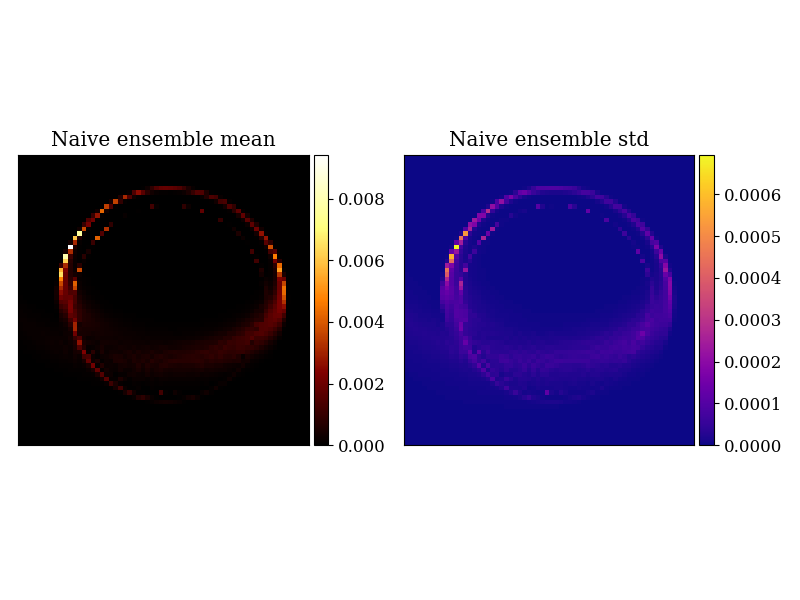

In [ ]:
#visualize ensemble movie std in 2D

importlib.reload(bhnerf.visualization)


if True:
    print(movies.shape)
    Nens, nt, Ny, Nx = movies.shape
    y, x = np.arange(Ny), np.arange(Nx)
    plt.close("all")
    mov_da = xr.DataArray(movies, 
                          dims=('ens', 't', 'y', 'x'), 
                          coords={'t':t_frames, 'y':y, 'x':x}
    )
    %matplotlib widget
    mean_da = mov_da.mean('ens')
    std_da = mov_da.std('ens')
    fig, axes = plt.subplots(1, 2, figsize=(8, 6))

    out = Path("/srv/tmp/kyle/bhnerf/results/naive_ensemble/tutorial4_mean_and_uncertainty_framescaled2D.mp4")
    #m = mean_da.bv_viz.animate(cmap='afmhot', ax=axes[0], output=out_m, fps=20)
    #s = std_da.bv_viz.animate(cmap='plasma', ax=axes[1], output=out_s, fps=20)
    anim = bhnerf.visualization.animate_movies_synced([mean_da, std_da], axes=axes, cmaps=['afmhot', 'plasma'], titles=['Naive ensemble mean', 'Naive ensemble std'], output=out)


    axes[0].set_title('Naive ensemble mean')
    axes[1].set_title('Naive ensemble std')
    plt.tight_layout()
else:
    bhnerf.visualization.ipyvolume_3d(mean_vol, fov=fov_M, level=[0,0.2,0.7])

/srv/tmp/kyle/bhnerf/bhnerf/visualization.py:369: AccessorRegistrationWarning: registration of accessor <class 'bhnerf.visualization._VisualizationAccessor'> under name 'bv_viz' for type <class 'xarray.core.dataarray.DataArray'> is overriding a preexisting attribute with the same name.
  class _VisualizationAccessor(object):


Container(children=[VBox(children=(HBox(children=(Label(value='levels:'), FloatSlider(value=0.1, max=1.0, step…

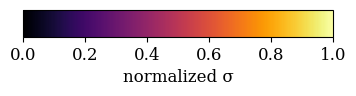

In [ ]:
#visualize ensemble std in 3D
std_norm = np.clip((std_vol - std_vol.min())/(std_vol.max()-std_vol.min()), 0, 1)
importlib.reload(bhnerf.visualization)
bhnerf.visualization.show_uncert_volume(std_norm, fov_M,
                       cmap_name="inferno",
                       level_norm=[.0,.4,.8,1.0],
                       opacity   =[0,.1,.5,.9])


In [141]:
import ipyvolume as ipv

# std_vol is your 3D numpy array of shape (Z, Y, X)
std_vol = std_vol.astype(np.float32)
fov = fov_M  # your field‐of‐view scalar

# pick nice iso‐levels inside the data range
vmin, vmax = np.percentile(std_vol, [5, 99])
levels   = np.linspace(vmin, vmax, 4).tolist()   # e.g. [σ5%, σ37%, σ69%, σ99%]
opacities = np.linspace(0.05, 0.4, len(levels)).tolist()

# build the 3×2 extent list
extent = [
    (-fov/2, +fov/2),   # x‐limits
    (-fov/2, +fov/2),   # y‐limits
    (-fov/2, +fov/2),   # z‐limits
]

ipv.figure()
# tweak camera if you’d like
ipv.view(azimuth=30, elevation=30, distance=2.5)

# note extent is THREE 2‐tuples, not one flat list
ipv.volshow(
    std_vol,
    extent=extent,
    level=levels,
    opacity=opacities,
    controls=True,
)
ipv.show()

Container(children=[VBox(children=(HBox(children=(Label(value='levels:'), FloatSlider(value=0.0, max=1.0, step…

In [108]:
import plotly.graph_objects as go
import numpy as np

# 1) Compute the raw vmin/vmax in σ
vmin_raw, vmax_raw = np.percentile(std_vol, [0, 100])

# 2) Normalize into [0,1]
std_norm = np.clip((std_vol - vmin_raw) / (vmax_raw - vmin_raw), 0, 1)
Z, Y, X = std_norm.shape
x = np.linspace(-fov_M/2, fov_M/2, X)
y = np.linspace(-fov_M/2, fov_M/2, Y)
z = np.linspace(-fov_M/2, fov_M/2, Z)
  
# make coordinate grid once
Xg, Yg, Zg = np.meshgrid(x, y, z, indexing='xy')

fig = go.Figure(
    data=go.Volume(
        x=Xg.flatten(),
        y=Yg.flatten(),
        z=Zg.flatten(),
        value=std_norm.flatten(),
  
        # now isomin/isomax are in [0,1]
        isomin=0.05,    # 5th percentile
        isomax=0.8,     # 80th percentile
          
        # a 5‑point opacity scale that stays transparent until you get to moderate sigma
        opacityscale=[
            [0.00, 0.00],
            [0.05, 0.05],
            [0.20, 0.15],
            [0.40, 0.30],
            [0.60, 0.50],
            [0.80, 0.80],
            [1.00, 1.00],
        ],
        surface_count=8,
        colorscale="Inferno",
        showscale=True,
    )
)

fig.update_layout(
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z",
        aspectmode="cube"
    ),
    margin=dict(l=0, r=0, t=0, b=0),
)
fig.show()



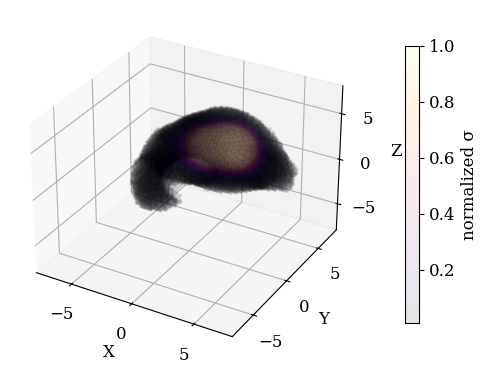

In [74]:
import numpy as np, matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# normalize & flatten
vmin, vmax = np.percentile(std_vol, [2, 99])
vol_norm = np.clip((std_vol - vmin)/(vmax - vmin), 0,1)

Z,Y,X = vol_norm.shape
x = np.linspace(-fov_M/2, fov_M/2, X)
y = np.linspace(-fov_M/2, fov_M/2, Y)
z = np.linspace(-fov_M/2, fov_M/2, Z)
Xg,Yg,Zg = np.meshgrid(x,y,z, indexing='xy')

vals = vol_norm.flatten()
mask = vals > 0.01   # only voxels >5%  
xs = Xg.flatten()[mask]
ys = Yg.flatten()[mask]
zs = Zg.flatten()[mask]
cs = vals[mask]

fig = plt.figure(figsize=(6,6))
ax  = fig.add_subplot(111, projection='3d')

p = ax.scatter(
    xs, ys, zs,
    c=cs, cmap='inferno',
    alpha=0.1, s=2,
)
ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
ax.set_xlim(-fov_M/2,fov_M/2); ax.set_ylim(-fov_M/2,fov_M/2); ax.set_zlim(-fov_M/2,fov_M/2)

cb = fig.colorbar(p, ax=ax, shrink=0.6, pad=0.1)
cb.set_label('normalized σ')

plt.show()


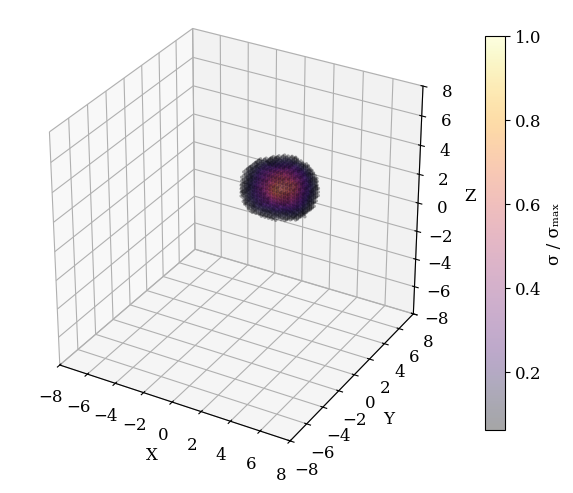

In [85]:
import numpy as np, matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D            # noqa

# 1 Normalise by the TRUE max so σ/σ_max ranges 0→1
vol_norm = std_vol / std_vol.max()

# 2 Keep everything above the 1‑percentile (far less aggressive)
thr = np.percentile(vol_norm, 99)      # ≈ 3‑4 × 10⁻⁸ for your cube
mask = vol_norm.ravel() >= thr

# 3 Prepare point cloud
Z, Y, X = vol_norm.shape
x = np.linspace(-fov_M/2, fov_M/2, X)
y = np.linspace(-fov_M/2, fov_M/2, Y)
z = np.linspace(-fov_M/2, fov_M/2, Z)
Xg, Yg, Zg = np.meshgrid(x, y, z, indexing="xy")

xs, ys, zs = Xg.ravel()[mask], Yg.ravel()[mask], Zg.ravel()[mask]
cs         = vol_norm.ravel()[mask]

# 4 Plot
fig = plt.figure(figsize=(6,6))
ax  = fig.add_subplot(111, projection="3d")
p   = ax.scatter(xs, ys, zs, c=cs, cmap="inferno",
                 alpha=0.35, s=6, linewidth=0)

# equal aspect (mpl ≥3.4) – if older, use helper below
ax.set_box_aspect([1,1,1])

ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
for a in (ax.set_xlim, ax.set_ylim, ax.set_zlim):
    a(-fov_M/2, fov_M/2)

cb = fig.colorbar(p, ax=ax, shrink=0.7, pad=0.05)
cb.set_label("σ / σₘₐₓ")
plt.tight_layout()
plt.show()
